## Load and Process Badminton Data

This code snippet performs the following tasks:

1. Loads data from an Excel file named 'badmintondata.xlsx' using the `read_excel` function.
2. Identifies consecutive rows of all zeros in the loaded data using a boolean mask.
3. Creates groups based on the mask values, where each group represents a sequence of non-zero rows followed by zero rows.
4. Filters out consecutive rows of all zeros from the original dataframe using the inverted mask.

The resulting grouped dataframe can be used for further analysis or processing.


In [1]:
import pandas as pd

# Load the data from CSV
df = pd.read_csv('badmintondata.csv')

# Get the column headers
total_columns = df.columns.tolist()

# Identify consecutive rows of all zeros
mask = (df[total_columns] == 0).all(axis=1)  # Create a boolean mask indicating rows where all values in total_columns are zeros

groups = mask.cumsum()  # Create groups by cumulatively summing the mask values (1 for non-zero rows, increasing by 1 for zero rows)

# Filter out consecutive rows of all zeros
filtered_df = df[~mask]  # Filter the original dataframe to exclude consecutive rows of all zeros

filtered_df

,HUMAN PLAYER POSITION (X) metres,HUMAN PLAYER POSITION (Y) metres,INITITAL VELOCITY OF SHUTTELCOCK(m/s),INITIAL SHUTTELCOCK FIRING ANGLE (DEGREE),SHUTTELCOCK SLANT ANGLE TO SIDELINE(DEGREE),SHUTTLECOCK POSITIION IN AIR(X) metres,SHUTTLECOCK POSITIION IN AIR(Y) metres,SHUTTLECOCK POSITIION IN AIR(Z) metres
0,4,1,10,40,0,4.075543,1.000000,1.662912
1,4,1,10,40,0,4.152007,1.000000,1.724866
2,4,1,10,40,0,4.228906,1.000000,1.788139
3,4,1,10,40,0,4.302100,1.000000,1.845245
4,4,1,10,40,0,4.376877,1.000000,1.904128
...,...,...,...,...,...,...,...,...
72634,4,4,70,70,15,9.217823,5.398111,2.591053
72635,4,4,70,70,15,9.275177,5.413480,2.041410
72636,4,4,70,70,15,9.326363,5.427195,1.463594
72637,4,4,70,70,15,9.370879,5.439123,0.862842


## Add Time Field to Grouped Data

This code snippet extends the previous code and performs the following tasks:

1. Groups the filtered dataframe based on the groups created earlier.
2. Defines a function named `add_time_field` that adds a new column named 'Time' to each group.
3. The 'Time' column is calculated as the index position within each group multiplied by 10, representing time in milliseconds.
4. Applies the `add_time_field` function to each group in the grouped dataframe using the `apply` method.

The resulting `grouped_df` will now include the 'Time' column added to each group, representing the time in milliseconds for each row within the group.

This step is useful for adding a time-based dimension to the grouped data for further analysis or visualization.


In [7]:
import numpy as np

# Group the data before each group of zeros
grouped_df = filtered_df.groupby(groups, group_keys=False)

# Function to add a Time field to a group
def add_time_field(group):
    group['TIME'] = np.arange(len(group)) * 10  # Multiply by 10 to get time in ms
    return group

# Apply the add_time_field function to each group in the grouped_df
grouped_df = grouped_df.apply(add_time_field)

# Reorder the columns to have 'TIME' at the front
grouped_df = grouped_df[['TIME'] + list(grouped_df.columns[:-1])]

print(grouped_df.to_string(index=False))

# Save the dataframe as a CSV file
grouped_df.to_csv('cleaned_dataset.csv', index=False)


 TIME  HUMAN PLAYER POSITION (X) metres  HUMAN PLAYER POSITION (Y) metres  INITITAL VELOCITY OF SHUTTELCOCK(m/s)  INITIAL SHUTTELCOCK FIRING ANGLE (DEGREE)  SHUTTELCOCK SLANT ANGLE TO SIDELINE(DEGREE)  SHUTTLECOCK POSITIION IN AIR(X) metres  SHUTTLECOCK POSITIION IN AIR(Y) metres  SHUTTLECOCK POSITIION IN AIR(Z) metres
    0                                 4                                 1                                     10                                         40                                            0                                4.075543                                1.000000                                1.662912
   10                                 4                                 1                                     10                                         40                                            0                                4.152007                                1.000000                                1.724866
   20                                

The code snippet provided creates a figure with three subplots, each representing the position of a shuttlecock in a different axis (X, Y, Z) over time. The code accomplishes the following:

1. It sets up the figure and axes using the `subplots` function, creating a layout of 3 rows and 1 column.
2. For each subplot, it plots the corresponding shuttlecock position data against time using scatter plots.
3. It sets the labels for the x-axis and y-axis of each subplot.
4. It sets titles for each subplot indicating the shuttlecock position axis.
5. It adjusts the layout to prevent overlapping of plot elements using the `tight_layout` function.
6. Finally, it displays the plot using the `show` function.

The scatter plots visualize the position of the shuttlecock in each axis (X, Y, Z) over time, with time represented on the x-axis in milliseconds and position represented on the y-axis in meters. Each scatter plot uses markers in the shape of "x" and has a small size (s=2) and moderate transparency (alpha=0.8) to avoid overcrowding the plot.

This code can be used to analyze and visualize the trajectory or movement patterns of a shuttlecock in three-dimensional space over a given period of time.


In [19]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Read the dataset
dataset = pd.read_csv('cleaned_dataset.csv')

# Define the columns to remove
columns_to_remove = ['SHUTTLECOCK POSITIION IN AIR(X) metres', 'SHUTTLECOCK POSITIION IN AIR(Y) metres']

# Get the remaining columns
total_columns = [column for column in dataset.columns if column not in columns_to_remove]

def addRidgeAndLasso(name_of_column, predicting_column):
    columns = ['Model', 'Train error', 'Test error', 'Sum of Absolute Weights']

    # Create copies of the relevant data
    whole_data_df = dataset[total_columns].copy()
    predicting_df = dataset[predicting_column].copy()

    # Split the data into training and test sets
    X_train, X_test, Y_train, Y_test = train_test_split(whole_data_df, predicting_df, test_size=0.3, random_state=12)

    # Perform Ridge regression
    ridge = linear_model.Ridge(alpha=0.5)
    ridge.fit(X_train, Y_train)
    Y_pred_train_ridge = ridge.predict(X_train)
    Y_pred_test_ridge = ridge.predict(X_test)

    # Format Ridge model equation
    ridge_model = "%.2f X + %.2f X2 + %.2f X3 + %.2f X4 + %.2f X5 + %.2f X6 + %.2f X7 + %.2f" % tuple(
        ridge.coef_.tolist() + [ridge.intercept_])

    ridge_result = [ridge_model, np.sqrt(mean_squared_error(Y_train, Y_pred_train_ridge)),
                    np.sqrt(mean_squared_error(Y_test, Y_pred_test_ridge)),
                    np.absolute(ridge.coef_).sum() + np.absolute(ridge.intercept_)]

    ridge_results = pd.DataFrame([ridge_result], columns=columns, index=['Ridge' + name_of_column])

    # Perform Lasso regression
    lasso = linear_model.Lasso(alpha=0.01)
    lasso.fit(X_train, Y_train)
    Y_pred_train_lasso = lasso.predict(X_train)
    Y_pred_test_lasso = lasso.predict(X_test)

    # Format Lasso model equation
    lasso_model = "%.2f X + %.2f X2 + %.2f X3 + %.2f X4 + %.2f X5 + %.2f X6 + %.2f X7 + %.2f" % tuple(
        lasso.coef_.tolist() + [lasso.intercept_])

    lasso_result = [lasso_model, np.sqrt(mean_squared_error(Y_train, Y_pred_train_lasso)),
                    np.sqrt(mean_squared_error(Y_test, Y_pred_test_lasso)),
                    np.absolute(lasso.coef_).sum() + np.absolute(lasso.intercept_)]

    lasso_results = pd.DataFrame([lasso_result], columns=columns, index=['Lasso' + name_of_column])
    lasso_weight = np.concatenate((lasso.coef_, [lasso.intercept_]))

    # Combine and return the results
    return pd.concat([ridge_results, lasso_results]), lasso_weight

columns = [" regularization for X", " regularization for Y"]
predicting_columns = ['SHUTTLECOCK POSITIION IN AIR(X) metres', 'SHUTTLECOCK POSITIION IN AIR(Y) metres']
regularization = []

# Iterate over the columns and predicting columns
for column, predicting_column in zip(columns, predicting_columns):
    result, lasso_weight = addRidgeAndLasso(f" regularization for {column}", predicting_column)
    regularization.append({'Lasso Weight': lasso_weight})
    print(column)
    print(result.to_string(index=False))
    print()

# Create a DataFrame for the regularization weights
regularization = pd.DataFrame(regularization, index=['X', 'Y'])


 regularization for X
                                                                      Model  Train error  Test error  Sum of Absolute Weights
0.00 X + 0.00 X2 + 0.00 X3 + 0.05 X4 + -0.05 X5 + -0.00 X6 + 0.09 X7 + 6.55     0.461762    0.468010                 6.756262
0.00 X + 0.00 X2 + 0.00 X3 + 0.05 X4 + -0.05 X5 + -0.00 X6 + 0.09 X7 + 6.55     0.461835    0.468387                 6.744249

 regularization for Y
                                                                      Model  Train error  Test error  Sum of Absolute Weights
0.00 X + 0.00 X2 + 1.00 X3 + 0.01 X4 + -0.01 X5 + 0.06 X6 + 0.02 X7 + -0.22     0.311729    0.307787                 1.329147
0.00 X + 0.00 X2 + 0.98 X3 + 0.01 X4 + -0.01 X5 + 0.06 X6 + 0.02 X7 + -0.20     0.312032    0.308184                 1.291822



## Create feature datasets and apply regularization using Lasso weights

<b>Step 1: Create the feature dataset</b>
<br>Remove columns related to shuttlecock position from the original dataset to create a feature dataset.

<b>Step 2: Create a new feature dataset without columns with zero Lasso weights</b>
<br>Identify columns with zero Lasso weights for each axis and exclude them from the original feature dataset to create a new feature dataset.

<b>Step 3: Store the new feature dataset</b>
<br>Store the new feature dataset, free of columns with zero Lasso weights, in the feature_datasets dictionary using the axis as the key.

<b>Step 4: Repeat for each axis</b>
<br>Iterate through each axis in the regularization dataset to create and store a new feature dataset for each axis. This ensures comprehensive regularization using Lasso weights across all axes.


In [24]:
import pandas as pd

# Initialize an empty dictionary to store the feature datasets
feature_datasets = {}

# Define the columns related to shuttlecock position
shuttlecock_position_columns = ['SHUTTLECOCK POSITIION IN AIR(X) metres', 'SHUTTLECOCK POSITIION IN AIR(Y) metres', 'SHUTTLECOCK POSITIION IN AIR(Z) metres']

# Create the feature dataset by dropping the shuttlecock position columns
feature = dataset.drop(shuttlecock_position_columns, axis=1)

# Iterate over the regularization weights for each axis
for axis, weights in regularization.iterrows():
    # Retrieve the Lasso weights for the current axis
    lasso_weights = weights['Lasso Weight']
    
    # Find the indices of the Lasso weights that are zero
    columns_to_remove = [index for index, weight in enumerate(lasso_weights) if weight == 0]
    
    # Create a new feature dataset by removing the columns with zero Lasso weights
    feature_dataset[axis] = feature.drop(feature.columns[columns_to_remove], axis=1, errors='ignore')
    
    # Print the dataset for the current axis
    print(f'Dataset for {axis}:')
    print(feature_dataset[axis].head(3).to_string(index=False))
    print()

Dataset for X:
 TIME  INITITAL VELOCITY OF SHUTTELCOCK(m/s)  INITIAL SHUTTELCOCK FIRING ANGLE (DEGREE)  SHUTTELCOCK SLANT ANGLE TO SIDELINE(DEGREE)
    0                                     10                                         40                                            0
   10                                     10                                         40                                            0
   20                                     10                                         40                                            0

Dataset for Y:
 TIME  HUMAN PLAYER POSITION (Y) metres  INITITAL VELOCITY OF SHUTTELCOCK(m/s)  INITIAL SHUTTELCOCK FIRING ANGLE (DEGREE)  SHUTTELCOCK SLANT ANGLE TO SIDELINE(DEGREE)
    0                                 1                                     10                                         40                                            0
   10                                 1                                     10                         

## Standardization of a dataset 

This code snippet performs the standardization of a dataset using the fit_transform method of the scaler object. The process involves calculating the mean and standard deviation of the data and then scaling it accordingly. The resulting standardized data is stored in the standardized_dataset dictionary, with the current axis serving as the key.

The purpose of standardization is to transform the dataset in such a way that each feature has a mean of 0 and a standard deviation of 1. This normalization process is beneficial for certain algorithms or analyses that rely on standardized features. By standardizing the data, we make it more suitable for these algorithms and ensure that they operate effectively regardless of the original scale or distribution of the features.

In [21]:
from sklearn.preprocessing import StandardScaler

standardized_dataset = {}

# Iterate over each axis and corresponding data in the feature dataset
for axis, data in feature_dataset.items():
    # Initialize a StandardScaler instance and fit-transform the data
    scaler = StandardScaler()
    standardized_data = scaler.fit_transform(data)
    
    # Create a new DataFrame using the standardized data and column names from the original dataset
    standardized_df = pd.DataFrame(standardized_data, columns=data.columns)
    
    # Store the standardized DataFrame in the standardized_dataset dictionary
    standardized_dataset[axis] = standardized_df
    
    # Print the first 3 rows of the standardized DataFrame for the current axis
    print(f'Standardized dataset for {axis}:')
    print(standardized_df.head(3).to_string(index=False))
    print()

Standardized dataset for X:
     TIME  INITITAL VELOCITY OF SHUTTELCOCK(m/s)  INITIAL SHUTTELCOCK FIRING ANGLE (DEGREE)  SHUTTELCOCK SLANT ANGLE TO SIDELINE(DEGREE)
-1.517116                              -0.357886                                  -1.482517                                    -1.441028
-1.493337                              -0.357886                                  -1.482517                                    -1.441028
-1.469559                              -0.357886                                  -1.482517                                    -1.441028

Standardized dataset for Y:
     TIME  HUMAN PLAYER POSITION (Y) metres  INITITAL VELOCITY OF SHUTTELCOCK(m/s)  INITIAL SHUTTELCOCK FIRING ANGLE (DEGREE)  SHUTTELCOCK SLANT ANGLE TO SIDELINE(DEGREE)
-1.517116                         -1.246518                              -0.357886                                  -1.482517                                    -1.441028
-1.493337                         -1.246518          

## Performs Principal Component Analysis (PCA) on a standardized dataset for each axis 

<b>Step 1: Get explained variance ratios</b>
<br>Retrieve the ratios indicating how much variance each principal component explains.

<b>Step 2: Calculate cumulative variance</b>
<br>Compute the cumulative sum of the explained variance ratios.

<b>Step 3: Create plots</b>
<br>Visualize the explained variance ratios and cumulative variance.

<b> Step 4: Set threshold</b>
<br>Determine the desired level of variance to retain.

<b>Step 5: Find components to keep</b>
<br>Identify the number of principal components that meet or exceed the threshold.

These steps help in understanding the importance of each principal component in explaining the variance present in the dataset. By choosing an appropriate threshold, the dimensionality of the dataset can be reduced while still retaining a significant amount of information.

Principal Component(s) to keep for X: 3



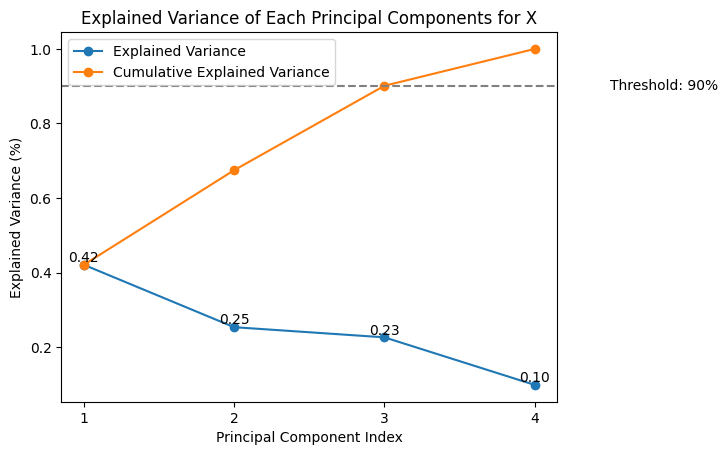

Principal Component(s) to keep for Y: 4



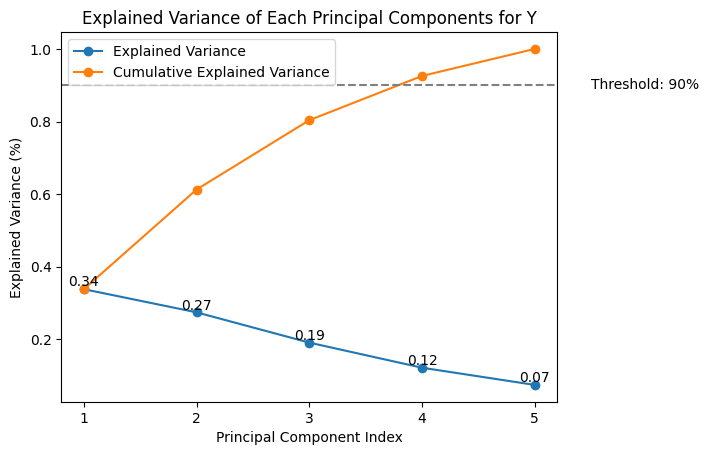

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Iterate over each axis and its corresponding data in the standardized dataset
for axis, data in standardized_dataset.items():
    # Perform PCA on the data
    pca = PCA()
    pca.fit(data)

    # Obtain the explained variance and cumulative explained variance ratios
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = pca.explained_variance_ratio_.cumsum()

    # Create x-axis values for plotting
    x_axis = np.arange(1, len(explained_variance) + 1)

    # Create a figure and axes for plotting
    fig, ax = plt.subplots()

    # Plot the explained variance ratios
    ax.plot(x_axis, explained_variance, marker='o', linestyle='-', label='Explained Variance')

    # Add text annotations for each data point in the explained variance plot
    for index, variance in enumerate(explained_variance):
        ax.text(x_axis[index], variance, f'{variance:.2f}', ha='center', va='bottom')

    # Plot the cumulative explained variance ratios
    ax.plot(x_axis, cumulative_variance, marker='o', linestyle='-', label='Cumulative Explained Variance')

    # Set labels, title, and legend for the plot
    ax.set_xlabel('Principal Component Index')
    ax.set_ylabel('Explained Variance (%)')
    ax.set_xticks(x_axis)
    ax.set_title(f'Explained Variance of Each Principal Component for {axis}')
    ax.legend()

    # Set a threshold for the cumulative explained variance
    threshold = 0.9

    # Add a horizontal line at the threshold and annotate the threshold value
    ax.axhline(y=threshold, color='grey', linestyle='--')
    ax.text(x_axis[-1] + 0.5, threshold, f"Threshold: {threshold:.0%}", ha='left', va='center')

    # Determine the number of principal components to keep based on the threshold
    number_component = np.argmax(cumulative_variance >= threshold) + 1

    # Print the number of principal components to keep for the current axis
    print(f"Principal Component(s) to keep for {axis}:", number_component)
    print()

    # Display the plot
    plt.show()

## PCA Transformation and Dataset Export

The variable 'number_component' is used to specify the desired number of principal components to be extracted during the PCA transformation. The fit_transform() method is then applied to perform the PCA transformation on the data corresponding to the current axis. Finally, the transformed dataset is exported to a CSV file.

In [27]:
# Assuming 'standardized_dataset' is a dictionary containing standardized data for each axis
for axis, data in standardized_dataset.items():
    number_component = 3  # Specify the desired number of principle components
    
    # Perform PCA on the data
    pca = PCA(n_components=number_component)
    principle_component = pd.DataFrame(data=pca.fit_transform(data),
                                       columns=[f'Principle Component {index + 1}' for index in range(number_component)])

    # Combine principle components with shuttlecock position columns from the original dataset
    transformed_dataset = pd.concat([principle_component, dataset[shuttlecock_position_columns]], axis=1)
    
    # Save the transformed dataset to a CSV file
    transformed_dataset.to_csv(f'{axis}_axis_transformed.csv', index=False)
    
    # Print the first 3 rows of the transformed dataset
    print(f"Transformed dataset for {axis} axis:")
    print(transformed_dataset.head(3).to_string(index=False))

Transformed dataset for X axis:
 Principle Component 1  Principle Component 2  Principle Component 3  SHUTTLECOCK POSITIION IN AIR(X) metres  SHUTTLECOCK POSITIION IN AIR(Y) metres  SHUTTLECOCK POSITIION IN AIR(Z) metres
             -0.597028              -2.214730               1.200238                                4.075543                                     1.0                                1.662912
             -0.607529              -2.204693               1.183832                                4.152007                                     1.0                                1.724866
             -0.618029              -2.194656               1.167425                                4.228906                                     1.0                                1.788139
Transformed dataset for Y axis:
 Principle Component 1  Principle Component 2  Principle Component 3  SHUTTLECOCK POSITIION IN AIR(X) metres  SHUTTLECOCK POSITIION IN AIR(Y) metres  SHUTTLECOCK POSITIION IN AIR(Z